### Imports and Dataset Class

In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt


In [2]:
if torch.cuda.is_available():
    device = torch.device("cuda")
elif hasattr(torch.backends, 'mps') and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"Using device: {device}")

Using device: mps


In [3]:
class UnderwaterDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        
        # Get lists of image filenames for trainA and trainB
        trainA_files = sorted(os.listdir(os.path.join(root_dir, 'trainA')))
        trainB_files = sorted(os.listdir(os.path.join(root_dir, 'trainB')))
        
        # Ensure that only files that exist in both trainA and trainB are included
        self.common_files = [file for file in trainA_files if file in trainB_files]
        
        self.trainA = [os.path.join(root_dir, 'trainA', file) for file in self.common_files]
        self.trainB = [os.path.join(root_dir, 'trainB', file) for file in self.common_files]
    
    def __len__(self):
        return len(self.common_files)
    
    def __getitem__(self, idx):
        imgA_path = self.trainA[idx]
        imgB_path = self.trainB[idx]
        
        imgA = Image.open(imgA_path).convert("RGB")
        imgB = Image.open(imgB_path).convert("RGB")
        
        if self.transform:
            imgA = self.transform(imgA)
            imgB = self.transform(imgB)
        
        return imgA, imgB


First we are importing necessary libraries.

UnderwaterDataset class:

This class inherits from torch.utils.data.Dataset
It loads paired images from 'trainA' and 'trainB' directories
The __getitem__ method returns a pair of images (input and target)
This allows easy batch loading of data during training

### Image Transformations

In [4]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])


This cell defines the image preprocessing pipeline:

It uses torchvision.transforms.Compose to chain multiple transformations

Images are resized to 256x256 pixels

Converted to PyTorch tensors

Normalized to a range of [-1, 1]

These transformations ensure all images are in a consistent format for the neural networks.

### Generator Class

In [5]:
class SeapixGANGenerator(nn.Module):
    def __init__(self):
        super(SeapixGANGenerator, self).__init__()

        # Encoder layers
        self.encoder = nn.ModuleList([
            self.conv_block(3, 64),
            self.conv_block(64, 128),
            self.conv_block(128, 256),
            self.conv_block(256, 512),
            self.conv_block(512, 512),
            self.conv_block(512, 512),
            self.conv_block(512, 512)
        ])
        
        # Decoder layers using the _DecodeLayer class
        self.decoder = nn.ModuleList([
            _DecodeLayer(512, 512, dropout=True),
            _DecodeLayer(1024, 512, dropout=True),
            _DecodeLayer(1024, 512, dropout=True),
            _DecodeLayer(1024, 256),
            _DecodeLayer(512, 128),
            _DecodeLayer(256, 64)
        ])
        
        # Final output layer
        self.final = nn.Sequential(
            nn.ConvTranspose2d(128, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
    
    def conv_block(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1, dropout=False):
        layers = [
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True)
        ]
        if dropout:
            layers.append(nn.Dropout(0.5))
        return nn.Sequential(*layers)

    def forward(self, x):
        enc_outputs = []

        # Encoder path
        for layer in self.encoder:
            x = layer(x)
            enc_outputs.append(x)

        # Decoder path with skip connections
        for i, layer in enumerate(self.decoder):
            x = layer(x, enc_outputs[-i-2])  # Use _DecodeLayer for decoding with skip connections

        # Final layer
        return self.final(x)


This cell defines the SeapixGANGenerator class:

It's based on a U-Net-like architecture, commonly used for image-to-image translation tasks such as underwater image enhancement.

The generator uses an encoder-decoder structure with skip connections, which is essential for preserving spatial details during image enhancement.

The encoder progressively downsamples the input image to extract key features, using convolutional layers with batch normalization and LeakyReLU activation.

The decoder progressively upsamples the feature maps back to the original image size, reconstructing the enhanced image using transposed convolutions, ReLU activations, and skip connections.

Skip connections between corresponding encoder and decoder layers help preserve fine details from the input image, ensuring that the generator can produce high-quality enhancements.

The final layer applies a tanh activation to output a 3-channel RGB image, with pixel values in the range [-1, 1], suitable for GAN-based image generation tasks.

### Discriminator Class

In [6]:
class SeapixGANDiscriminator(nn.Module):
    def __init__(self, in_channels=3):
        super(SeapixGANDiscriminator, self).__init__()
        
        def down_layer(in_filters, out_filters, normalization=True):
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalization:
                layers.append(nn.BatchNorm2d(out_filters, momentum=0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers
        
        # Define the PatchGAN discriminator structure
        self.model = nn.Sequential(
            *down_layer(2 * in_channels, 64, normalization=False),  # Concatenate input and target along channel axis
            *down_layer(64, 128),
            *down_layer(128, 256),
            *down_layer(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),  # Zero padding to preserve dimensions
            nn.Conv2d(512, 1, 4, padding=1, bias=False)  # Output 1x1 patch prediction
        )
    
    def forward(self, img_A, img_B):
        # Concatenate the two images (input and target/generated) along the channel dimension
        img_input = torch.cat((img_A, img_B), dim=1)
        return self.model(img_input)


Uses a Markovian PatchGAN architecture, which classifies patches of the underwater image as real or fake.

The discriminator evaluates 70x70 patches (or other small patches) of the underwater image, ensuring that local textures and details (e.g., water, pillar, coral) are realistically generated.

Consists of a series of downsampling convolutional layers, each followed by BatchNorm (except for the first layer) and LeakyReLU activations.

Takes both the enhanced (generated) underwater image and the real underwater image, concatenates them along the channel dimension, and passes them through the network.

The final layer produces a 1x1 output that classifies the authenticity of each patch.

This patch-based approach helps the generator learn to produce realistic local underwater features, ensuring high-quality textures, colors, and details in the enhanced images.

### Decode Layer Defined

In [7]:
class _DecodeLayer(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=False):
        super(_DecodeLayer, self).__init__()
        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(True)
        ]
        if dropout:
            layers.append(nn.Dropout(0.5))  # Dropout is used optionally
        self.decode = nn.Sequential(*layers)

    def forward(self, x, skip):
        # Perform upsampling and concatenate the skip connection from the encoder
        x = self.decode(x)
        return torch.cat((x, skip), dim=1)  # Concatenating along the channel dimension


This cell defines the _DecodeLayer class:

Used in the generator's decoder

Performs transposed convolution to upsample features

Applies batch normalization and ReLU activation

Optionally applies dropout for regularization

Implements skip connections by concatenating with encoder features

### Loss Functions

In [8]:
# Generator loss
def generator_loss(disc_generated_output, gen_output, target, l1_weight=100):
    """
    Calculates the generator loss as a combination of adversarial loss (BCE) and L1 loss.
    
    Args:
    - disc_generated_output: Discriminator's output for generated images (should be detached).
    - gen_output: Generated images.
    - target: Target/real images.
    - l1_weight: Weight for the L1 loss component.
    
    Returns:
    - Combined loss (adversarial + L1 loss).
    """
    # Adversarial loss for fooling the discriminator
    gan_loss = nn.BCEWithLogitsLoss()(disc_generated_output, torch.ones_like(disc_generated_output))

    # L1 loss to enforce pixel-level similarity between generated and target images
    l1_loss = nn.L1Loss()(gen_output, target)

    # Combine the losses with the specified weight
    return gan_loss + l1_weight * l1_loss

# Discriminator loss
def discriminator_loss(disc_real_output, disc_generated_output):
    """
    Calculates the discriminator loss by summing the loss on real images and fake images.
    
    Args:
    - disc_real_output: Discriminator's output for real images.
    - disc_generated_output: Discriminator's output for generated (fake) images.
    
    Returns:
    - Total discriminator loss.
    """
    # Loss for real images (should be classified as real, i.e., 1)
    real_loss = nn.BCEWithLogitsLoss()(disc_real_output, torch.ones_like(disc_real_output))

    # Loss for generated (fake) images (should be classified as fake, i.e., 0)
    generated_loss = nn.BCEWithLogitsLoss()(disc_generated_output, torch.zeros_like(disc_generated_output))

    # Total loss is the sum of both real and generated losses
    return real_loss + generated_loss


generator_loss:

- Combines adversarial loss (which encourages the generator to fool the discriminator) with L1 loss (which measures the pixel-wise difference between the generated and target underwater images).

- The adversarial loss helps the generator create realistic underwater images, while the L1 loss ensures that the generated images are structurally and visually similar to the real target images.

- This combination encourages the generator to not only produce visually convincing underwater images but also to preserve fine details, color correction, and important features such as marine life and underwater textures.

discriminator_loss:

- Uses binary cross-entropy loss (BCE) to train the discriminator to correctly classify real and generated (fake) underwater images.

- The real images are labeled as 1 and the generated images as 0, and the discriminator learns to distinguish between them.

- This helps the discriminator improve its ability to detect whether enhanced underwater images are real or generated, ensuring that the generator produces more realistic outputs over time.

### Training step

In [9]:
def train_step(generator, discriminator, input_image, target_image, gen_optimizer, disc_optimizer):
    # Generate enhanced image from the generator
    generated_image = generator(input_image)

    # Get outputs from the discriminator
    disc_real_output = discriminator(input_image, target_image)
    disc_generated_output = discriminator(input_image, generated_image.detach())

    # Calculate generator and discriminator losses
    gen_loss = generator_loss(disc_generated_output, generated_image, target_image)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    # Print shapes and losses for debugging
    print(f"Generated Image Shape: {generated_image.shape}")
    print(f"Discriminator Real Output Shape: {disc_real_output.shape}")
    print(f"Discriminator Generated Output Shape: {disc_generated_output.shape}")
    print(f"Generator Loss: {gen_loss.item()}")
    print(f"Discriminator Loss: {disc_loss.item()}")

    # Backpropagation for generator
    gen_optimizer.zero_grad()
    if torch.isfinite(gen_loss):
        gen_loss.backward()
        nn.utils.clip_grad_norm_(generator.parameters(), max_norm=1.0)  # Gradient clipping
        gen_optimizer.step()
    else:
        print("Generator loss is not finite!")

    # Backpropagation for discriminator
    disc_optimizer.zero_grad()
    if torch.isfinite(disc_loss):
        try:
            disc_loss.backward()  # Backward pass for discriminator
            nn.utils.clip_grad_norm_(discriminator.parameters(), max_norm=1.0)  # Gradient clipping
            disc_optimizer.step()
        except RuntimeError as e:
            print(f"Error during discriminator backward pass: {e}")
    else:
        print("Disc loss is not finite!")

    return gen_loss, disc_loss


Generates enhanced underwater images using the generator, starting from the input (raw underwater image).

Computes discriminator outputs for both the real (target enhanced image) and fake (generated enhanced image) images, determining whether the discriminator can distinguish between real and generated enhancements.

Calculates the generator loss, which encourages the generator to produce realistic underwater images that are both visually convincing (via adversarial loss) and close to the real enhanced images (via L1 loss).

Calculates the discriminator loss, which trains the discriminator to correctly classify real enhanced images as real and generated enhanced images as fake.

Performs backpropagation and optimization for both the generator and discriminator, updating the model parameters to improve performance on the task of underwater image enhancement.

### Training Loop

In [10]:
def train(generator, discriminator, data_loader, epochs, gen_optimizer, disc_optimizer, gen_scheduler, disc_scheduler):
    """
    Trains the generator and discriminator models for underwater image enhancement on MPS.

    Args:
    - generator: The generator model.
    - discriminator: The discriminator model.
    - data_loader: DataLoader containing input and target underwater image pairs.
    - epochs: Number of training epochs.
    - gen_optimizer: Optimizer for the generator.
    - disc_optimizer: Optimizer for the discriminator.
    - gen_scheduler: Learning rate scheduler for the generator.
    - disc_scheduler: Learning rate scheduler for the discriminator.

    Returns:
    - None (saves the best model weights).
    """
    best_loss = float('inf')
    patience = 5
    no_improve = 0

    # Check if MPS is available and set the device to MPS, otherwise use CPU
    device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
    
    # Move models to the appropriate device
    generator.to(device)
    discriminator.to(device)
    
    for epoch in range(epochs):
        epoch_gen_loss = 0
        epoch_disc_loss = 0
        
        generator.train()  # Set generator to training mode
        discriminator.train()  # Set discriminator to training mode
        
        for batch in data_loader:
            input_image, target_image = batch
            input_image, target_image = input_image.to(device), target_image.to(device)
            
            # Training step
            gen_loss, disc_loss = train_step(generator, discriminator, input_image, target_image, gen_optimizer, disc_optimizer)
            
            epoch_gen_loss += gen_loss.item()
            epoch_disc_loss += disc_loss.item()
        
        avg_gen_loss = epoch_gen_loss / len(data_loader)
        avg_disc_loss = epoch_disc_loss / len(data_loader)
        
        # Logging loss for the epoch
        print(f"Epoch {epoch+1}/{epochs}, Gen Loss: {avg_gen_loss:.4f}, Disc Loss: {avg_disc_loss:.4f}")
        
        # Adjust learning rates
        gen_scheduler.step()
        disc_scheduler.step()
        
        # Early stopping based on generator loss
        if avg_gen_loss < best_loss:
            best_loss = avg_gen_loss
            no_improve = 0
            # Save the best generator and discriminator weights
            torch.save(generator.state_dict(), 'best_fine_tuned_generator.pth')
            torch.save(discriminator.state_dict(), 'best_fine_tuned_discriminator.pth')
            print(f"Saved best model at epoch {epoch+1} with Gen Loss: {avg_gen_loss:.4f}")
        else:
            no_improve += 1
            if no_improve == patience:
                print(f"Early stopping triggered after {epoch+1} epochs")
                break

    print("Training complete, best model weights saved.")


The train function runs the entire training process for underwater image enhancement:

- Iterates over the specified number of epochs, processing the dataset multiple times to optimize the generator and discriminator.

- Calls train_step for each batch of data, where the generator and discriminator are updated based on the input (raw underwater images) and target (enhanced underwater images).

- Implements early stopping to halt training if there is no improvement in generator loss over a set number of epochs, helping to prevent overfitting.

- Saves the best model weights (for both the generator and discriminator) when the generator loss improves during training, ensuring the best model is stored.

- Updates learning rates using schedulers for both the generator and discriminator to adjust the learning rates dynamically, improving training efficiency.

### Visualise results function

In [11]:
# Visualization function
def visualize_results(generator, data_loader, num_images=5, device='mps'):
    """
    Visualizes the results of the generator by comparing the input, generated, and target images.

    Args:
    - generator: The trained generator model.
    - data_loader: DataLoader with input and target image pairs.
    - num_images: Number of images to visualize.
    - device: Device to run the model on (default is 'mps').
    """
    generator.eval()  # Set the generator to evaluation mode
    with torch.no_grad():  # Disable gradient computation
        for i, (input_image, target_image) in enumerate(data_loader):
            if i >= num_images:
                break
            input_image = input_image.to(device)
            generated_image = generator(input_image)
            
            # Convert tensors to numpy arrays
            input_image = input_image.cpu().numpy().transpose(0, 2, 3, 1)[0]
            target_image = target_image.numpy().transpose(0, 2, 3, 1)[0]
            generated_image = generated_image.cpu().numpy().transpose(0, 2, 3, 1)[0]
            
            # Denormalize images (assuming normalization is in [-1, 1])
            input_image = (input_image + 1) / 2
            target_image = (target_image + 1) / 2
            generated_image = (generated_image + 1) / 2
            
            # Plot images
            fig, axs = plt.subplots(1, 3, figsize=(15, 5))
            axs[0].imshow(input_image)
            axs[0].set_title('Input Image')
            axs[0].axis('off')
            axs[1].imshow(generated_image)
            axs[1].set_title('Generated Image')
            axs[1].axis('off')
            axs[2].imshow(target_image)
            axs[2].set_title('Target Image')
            axs[2].axis('off')
            plt.show()
    
    generator.train()  # Set the generator back to training mode

### Execution

Generated Image Shape: torch.Size([4, 3, 256, 256])
Discriminator Real Output Shape: torch.Size([4, 1, 16, 16])
Discriminator Generated Output Shape: torch.Size([4, 1, 16, 16])
Generator Loss: 68.35218048095703
Discriminator Loss: 1.444100022315979
Error during discriminator backward pass: Trying to backward through the graph a second time (or directly access saved tensors after they have already been freed). Saved intermediate values of the graph are freed when you call .backward() or autograd.grad(). Specify retain_graph=True if you need to backward through the graph a second time or if you need to access saved tensors after calling backward.
Generated Image Shape: torch.Size([4, 3, 256, 256])
Discriminator Real Output Shape: torch.Size([4, 1, 16, 16])
Discriminator Generated Output Shape: torch.Size([4, 1, 16, 16])
Generator Loss: 68.13209533691406
Discriminator Loss: 1.4336702823638916
Error during discriminator backward pass: Trying to backward through the graph a second time (or 

/Users/ms/Desktop/Bx_Data/Paired/underwater_imagenet/Final_Set/seapixganenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:216: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


Saved best model at epoch 1 with Gen Loss: 33.8567
Generated Image Shape: torch.Size([4, 3, 256, 256])
Discriminator Real Output Shape: torch.Size([4, 1, 16, 16])
Discriminator Generated Output Shape: torch.Size([4, 1, 16, 16])
Generator Loss: 30.769500732421875
Discriminator Loss: 1.4357917308807373
Error during discriminator backward pass: Trying to backward through the graph a second time (or directly access saved tensors after they have already been freed). Saved intermediate values of the graph are freed when you call .backward() or autograd.grad(). Specify retain_graph=True if you need to backward through the graph a second time or if you need to access saved tensors after calling backward.
Generated Image Shape: torch.Size([4, 3, 256, 256])
Discriminator Real Output Shape: torch.Size([4, 1, 16, 16])
Discriminator Generated Output Shape: torch.Size([4, 1, 16, 16])
Generator Loss: 32.2744140625
Discriminator Loss: 1.4369542598724365
Error during discriminator backward pass: Trying

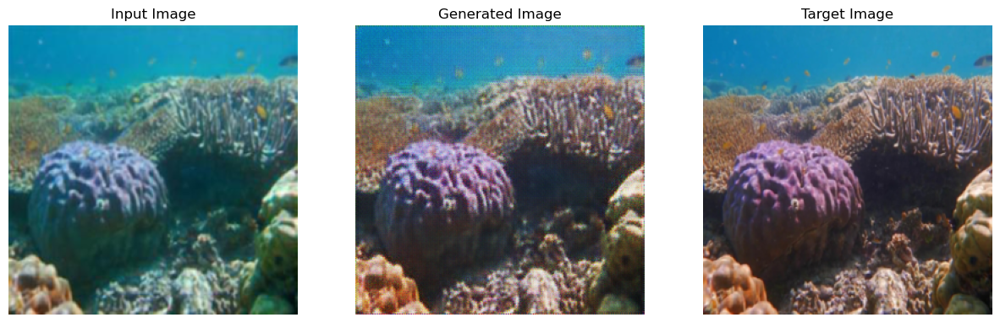

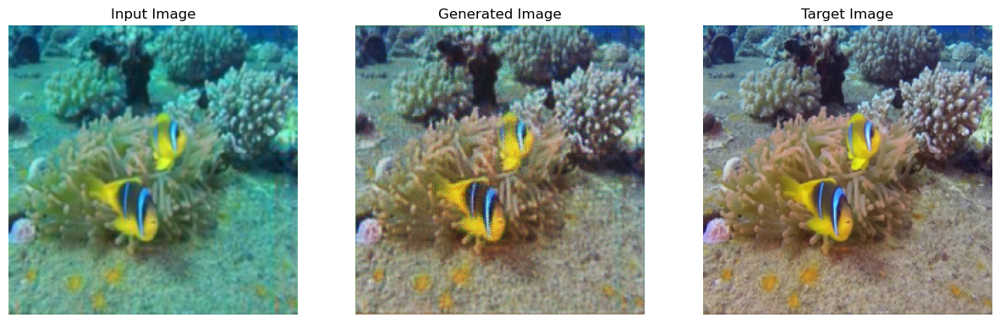

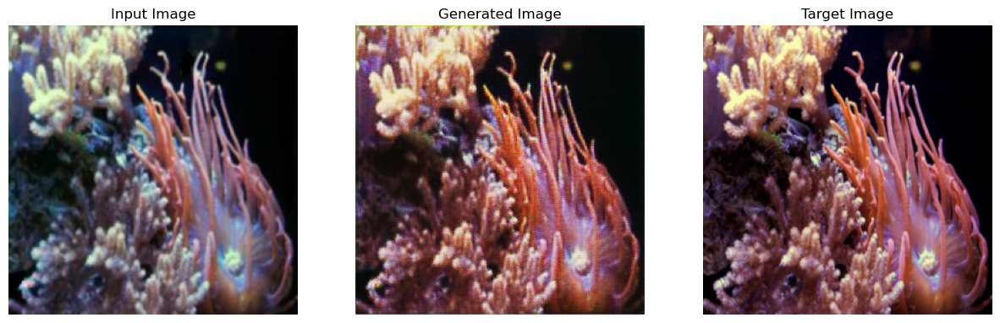

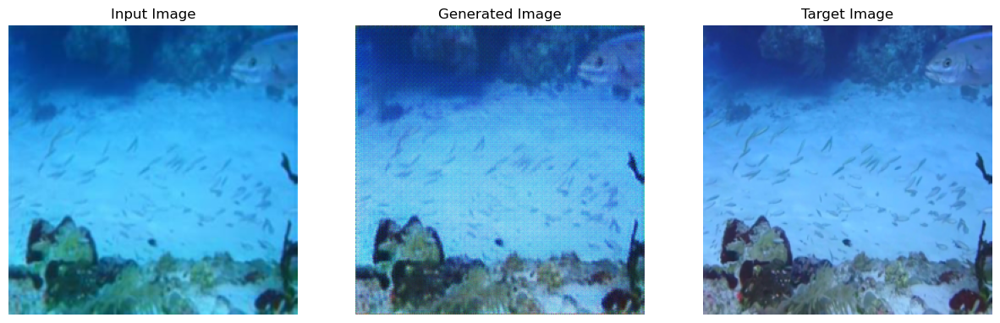

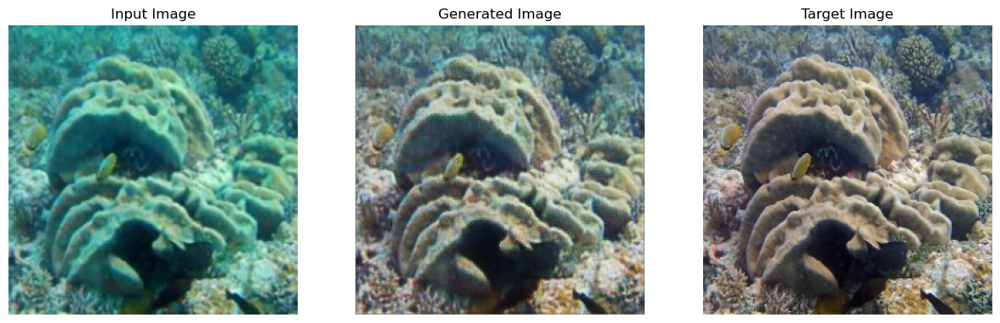

In [12]:
# Create Dataset and DataLoader
root_dir = './'  
batch_size = 4
dataset = UnderwaterDataset(root_dir, transform=transform)
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Initialize models
generator = SeapixGANGenerator().to('mps') 
discriminator = SeapixGANDiscriminator().to('mps')  

# Optimizers with a smaller learning rate
gen_optimizer = optim.Adam(generator.parameters(), lr=1e-5, betas=(0.5, 0.999))
disc_optimizer = optim.Adam(discriminator.parameters(), lr=1e-5, betas=(0.5, 0.999))

# Learning rate scheduler
from torch.optim.lr_scheduler import StepLR
gen_scheduler = StepLR(gen_optimizer, step_size=10, gamma=0.1)
disc_scheduler = StepLR(disc_optimizer, step_size=10, gamma=0.1)

# Train the model with MPS device
train(generator, discriminator, data_loader, epochs=50, gen_optimizer=gen_optimizer, 
      disc_optimizer=disc_optimizer, gen_scheduler=gen_scheduler, disc_scheduler=disc_scheduler)

# Visualize results
visualize_results(generator, data_loader, device='mps')  # Ensure device is passed to visualization
